# Model Testing Evaluation

In [22]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import os
import math
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix

In [16]:
MODEL_PATH = "/mnt/d/College/DL/PlantDiseaseDetection-Project/models/mobilenetv2_from_scratch.keras"
VALID_DIR = "/mnt/d/College/DL/PlantDiseaseDetection-Project/New Plant Diseases Dataset(Augmented)/valid"
TEST_DIR = "/mnt/d/College/DL/PlantDiseaseDetection-Project/test/test"

In [18]:
dummy_ds = tf.keras.utils.image_dataset_from_directory(
    VALID_DIR,
    labels='inferred',
    label_mode='int',
    image_size=(224, 224),
    batch_size=32,
    shuffle=False,
    verbose=0
)
class_names = dummy_ds.class_names

Loading model...
Found 33 images. Creating a 7x5 grid...


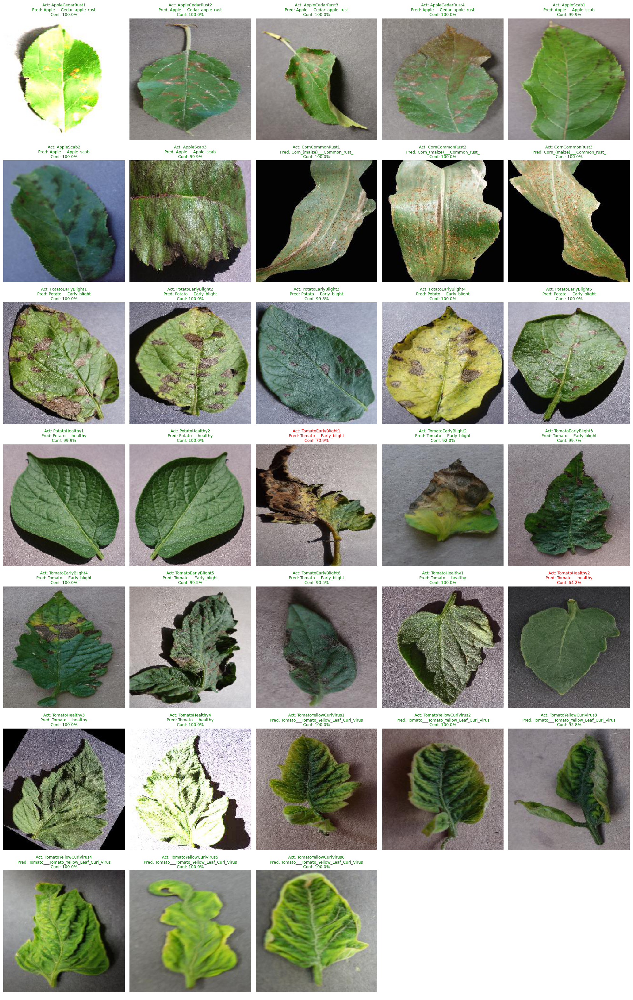

In [20]:
# --- 3. Load Model ---
print(f"Loading model...")
model = tf.keras.models.load_model(MODEL_PATH)

# --- 4. Prepare the Grid ---
files = [f for f in os.listdir(TEST_DIR) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
num_images = len(files)

cols = 5
rows = math.ceil(num_images / cols)

print(f"Found {num_images} images. Creating a {rows}x{cols} grid...")

# Create figure (increased height slightly to fit 3 lines of text)
fig, axes = plt.subplots(rows, cols, figsize=(20, rows * 4.5))
axes = axes.flatten()

# --- 5. Loop and Plot ---
for i, filename in enumerate(files):
    img_path = os.path.join(TEST_DIR, filename)
    ax = axes[i]
    
    try:
        # Load Image
        img = tf.keras.utils.load_img(img_path, target_size=(224, 224))
        img_array = tf.keras.utils.img_to_array(img)
        img_array = tf.expand_dims(img_array, 0)

        # Predict
        predictions = model.predict(img_array, verbose=0)
        predicted_class_index = np.argmax(predictions[0])
        predicted_label = class_names[predicted_class_index]
        confidence = np.max(predictions[0]) * 100
        
        # Clean up filename for "Actual" (remove .jpg extension)
        actual_label = os.path.splitext(filename)[0]

        # Plot
        ax.imshow(img)
        
        # Color title based on confidence
        title_color = 'green' if confidence > 80 else 'red'
        
        # --- UPDATED TITLE FORMAT ---
        # showing Actual (Filename), Prediction, and Confidence
        title_text = f"Act: {actual_label}\nPred: {predicted_label}\nConf: {confidence:.1f}%"
        
        ax.set_title(title_text, color=title_color, fontsize=9)
        ax.axis('off')
        
    except Exception as e:
        print(f"Error on {filename}: {e}")

# --- 6. Clean up empty slots ---
for i in range(num_images, len(axes)):
    axes[i].axis('off')

plt.tight_layout()
plt.show()

In [23]:
print("Predicting on Validation Set (this ensures we evaluate on labeled data)...")
predictions = model.predict(dummy_ds)
predicted_indices = np.argmax(predictions, axis=1)

Predicting on Validation Set (this ensures we evaluate on labeled data)...
550/550 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step


In [26]:
true_indices = np.concatenate([y for x, y in dummy_ds], axis=0)

# --- 4. Classification Report ---
print("\n-------------------------------------------------------")
print("               CLASSIFICATION REPORT")
print("-------------------------------------------------------")
print(classification_report(true_indices, predicted_indices, target_names=class_names))


-------------------------------------------------------
               CLASSIFICATION REPORT
-------------------------------------------------------
                                                    precision    recall  f1-score   support

                                Apple___Apple_scab       1.00      0.98      0.99       504
                                 Apple___Black_rot       0.99      1.00      1.00       497
                          Apple___Cedar_apple_rust       1.00      0.99      0.99       440
                                   Apple___healthy       0.93      1.00      0.96       502
                               Blueberry___healthy       0.98      0.99      0.98       454
          Cherry_(including_sour)___Powdery_mildew       1.00      1.00      1.00       421
                 Cherry_(including_sour)___healthy       0.99      1.00      1.00       456
Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot       0.98      0.92      0.95       410
                     

2025-11-19 14:00:16.009664: I tensorflow/core/framework/local_rendezvous.cc:405] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


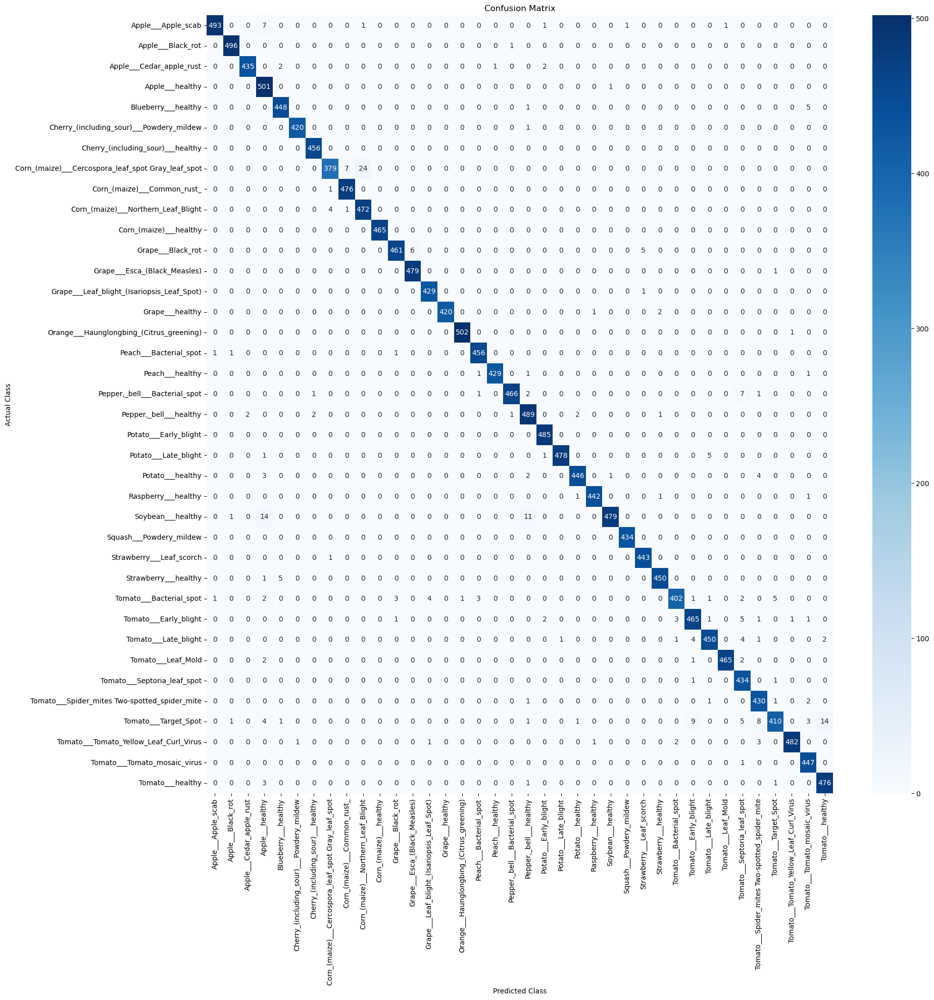

In [27]:
# --- 5. Confusion Matrix Heatmap ---
plt.figure(figsize=(20, 20))
cm = confusion_matrix(true_indices, predicted_indices)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted Class')
plt.ylabel('Actual Class')
plt.title('Confusion Matrix')
plt.show()